# AUPE Processing for Ries Crater Field Trip May 2025

This notebook provides a template for processing AUPE scenes that contain:
- LWAC, RGB & Geology Filters, with calibration target
- RWAC, RGB & Geology Filters, with calibration target
- HRC, without calibration target

Developed for processing of the Ries Crater field trip, May 2025.

R. Stabbins  
Natural History Museum, London, UK  
9/6/2025

# Overview

This notebook guides a user through:
1. Sol, Scene, Trial selection
2. LWAC Processing
   1. RGB Approx. Processing
   2. RGB Reflectance & Colour Calibration
   3. Geology Reflectance Calibration
3. RWAC Processing
   1. RGB Approx. Processing
   2. RGB Reflectance & Colour Calibration
   3. Geology Reflectance Calibration
4. LWAC->RWAC Rectification
   1. Choose common feature to find optimal warp for feature distance
   2. Warp LWAC->RWAC to give LRWAC 12-band Cube from RWAC View
5. HRC Processing
   1. RGB Approx. Processing
   2. Reflectance transfer from RWAC Reflectance Calibration
6. RWAC->HRC Rectification
   1. Choose common feature to find optimal warp for distance
   2. Warp LRWAC 12-band Cube to HRC View

# Notebook and Scene Setup

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import aupy

In [3]:
from pathlib import Path

# Choosing a Sol, Scene and Trial

Get the data directory. Please put the field trip data directory in a folder next to this one, or edit the 'data_dir' path to give the path relative to this directory.

Alternatively, just give the complete path to the data directory.

In [4]:
data_dir = Path('..', 'data')
# check that the data directory exists
if not data_dir.exists():
    raise FileNotFoundError(f"Data directory {data_dir} does not exist.")

In [5]:
# make a list of all the directories in the data directory
sols = [d.name for d in data_dir.iterdir()]
# drop .DS_Store
sols = [s for s in sols if s != '.DS_Store']
sols.sort()

In [6]:
sols

['SOL1', 'SOL2', 'SOL3', 'SOL4', 'SOL5', 'SOL6', 'TEAM_RGB', 'sol99_4']

Choose a Sol to process.

In [7]:
sol = sols[1]
sol

'SOL2'

Find the scenes in the given sol:

In [8]:
# get the scenes in the sol directory
sol_dir = data_dir / sol
# check that the sol directory exists
if not sol_dir.exists():
    raise FileNotFoundError(f"Sol directory {sol_dir} does not exist.")
# get the scenes in the sol directory
scenes = [d.name for d in sol_dir.iterdir() if d.is_dir()]
scenes.sort()

In [9]:
scenes

['sol2_0',
 'sol2_1',
 'sol2_10',
 'sol2_11',
 'sol2_12',
 'sol2_13',
 'sol2_14',
 'sol2_15',
 'sol2_16',
 'sol2_17',
 'sol2_18',
 'sol2_19',
 'sol2_2',
 'sol2_20',
 'sol2_21',
 'sol2_22',
 'sol2_23',
 'sol2_3',
 'sol2_4',
 'sol2_5',
 'sol2_6',
 'sol2_7',
 'sol2_8',
 'sol2_9']

Choose a scene to process.

In [10]:
scene = scenes[-2]
scene

'sol2_8'

Check if the scene contains any trial directories

In [11]:
# look for subdirectorys in the scene directory
scene_dir = sol_dir / scene
# check that the scene directory exists
if not scene_dir.exists():
    raise FileNotFoundError(f"Scene directory {scene_dir} does not exist.")
# get the subdirectories in the scene directory
trials = [d.name for d in scene_dir.iterdir() if d.is_dir()]
trials.sort()

if trials == []:
    trials = ['']

trials

['']

Choose the trial (this may be the null trial '')

In [12]:
trial = trials[0]

# Processing

In [13]:
print(f'{sol} {scene} {trial}')

SOL2 sol2_8 


## LWAC Processing

### LWAC RGB Processing

Load the LWAC RGB Scene

In [14]:
# RGB Reflectance and Colour Calibration
lwac_rgb_msc_loader = aupy.AupeIO('LWAC', 'MSC', sol, scene, trial=trial, filter_ids=['L1R', 'L2G', 'L3B'])
lwac_rgb_msc = lwac_rgb_msc_loader.load_frame()
lwac_rgb_msc.exposure_correct()
lwac_rgb_msc.set_false_color({'R':'L1R', 'G':'L2G', 'B':'L3B'})

Export the approximate colour, by stretching each channel to the 99th percentile brightness value.

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced


PosixPath('../data/../processed/SOL2/sol2_8/Trial1/LWAC/MSC/RGB/SOL2_sol2_8_Trial1_LWAC_RGB_L1RL2GL3B_99b.png')

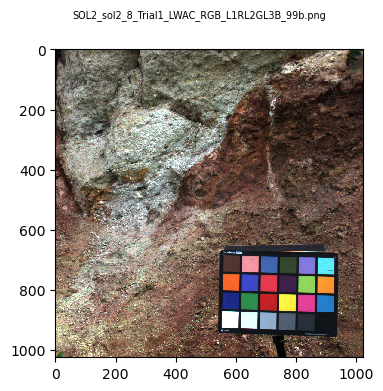

In [15]:
lwac_rgb_msc.false_rgb.export_image('99b', show=True)

Calibrate the scene reflectance to the calibration target.

Stretching image using 99th percentile balanced
Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


2025-06-11 12:02:44.861 python[83524:276823] +[IMKClient subclass]: chose IMKClient_Modern
2025-06-11 12:02:44.861 python[83524:276823] +[IMKInputSession subclass]: chose IMKInputSession_Modern


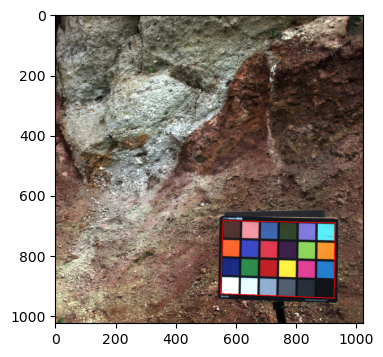

Target Width: 372 Height: 243, Samples: 900
Target Width: 372 Height: 243, Samples: 900
L1R 641 nm: coeff=9.86e-061/DN/s, offset=0.00605
L2G 540 nm: coeff=8.32e-061/DN/s, offset=0.0134
L3B 464 nm: coeff=7.64e-061/DN/s, offset=0.0447


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


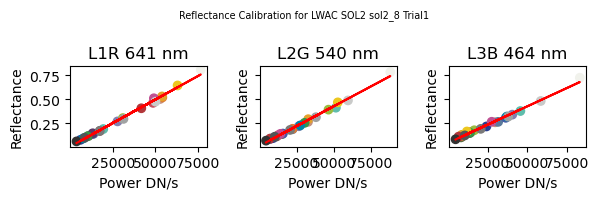

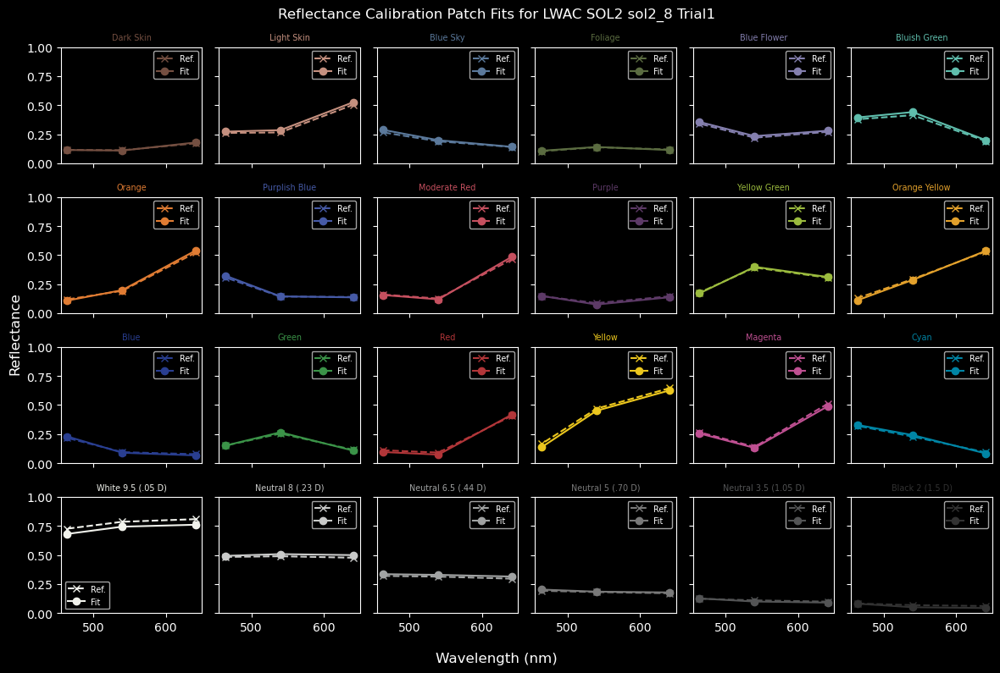

In [16]:
lwac_cal_targ = aupy.CalibrationTarget()
lwac_cal_targ.draw_target_outline(lwac_rgb_msc.false_rgb.get_image('99b'), show=True)
lwac_cal_targ.get_bad_patches(lwac_rgb_msc)
lwac_cal_targ.calibrate_reflectance(lwac_rgb_msc,show=True)

Calibrate the colour of the relfectance calibrated scene.

Target Width: 372 Height: 243, Samples: 900
Stretching image using brightest pixel unbalanced
Target Width: 372 Height: 243, Samples: 900


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


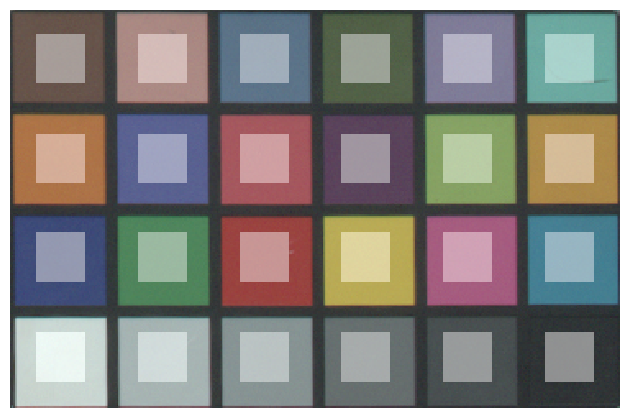

/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:68: RuntimeWarning: invalid value encountered in power
  return (x ** gamma)
/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:911: OptimizeWarning: Covariance of the parameters could not be estimated
  fit, covar = curve_fit(gamma_curve,


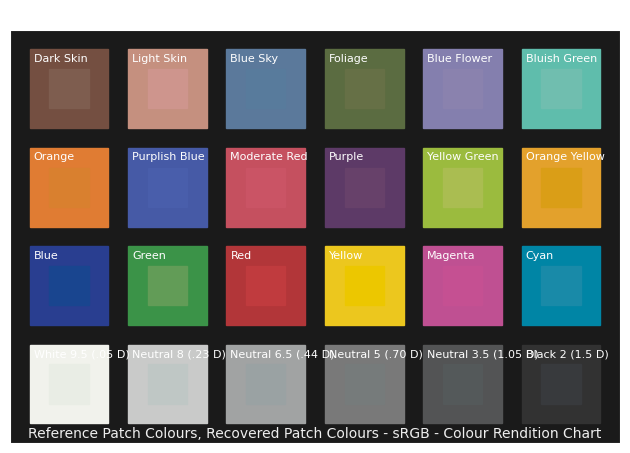

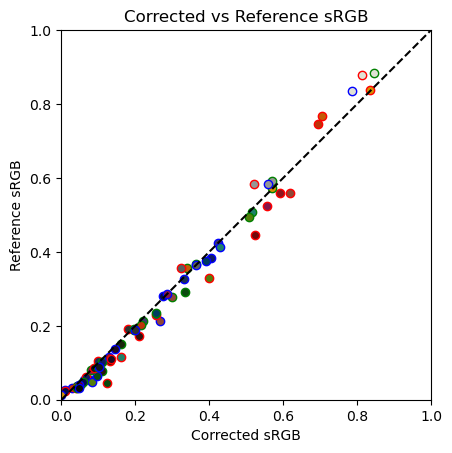

In [17]:
lwac_cal_targ.get_bad_patches(lwac_rgb_msc.false_rgb)
lwac_cal_targ.calibrate_colour(lwac_rgb_msc.false_rgb, show=True)

Export to ENVI and GIF.

Exporting image using colour correction matrix
Stretching image using brightest pixel unbalanced
CCM saved to ../data/../processed/SOL2/sol2_8/Trial1/LWAC/MSC/RGB/SOL2_sol2_8_Trial1_LWAC_ccm.csv
Reflectance coefficients saved to ../data/../processed/SOL2/sol2_8/Trial1/LWAC/MSC/SOL2_sol2_8_Trial1_LWAC_L1RL2GL3B_refl_coeffs.csv


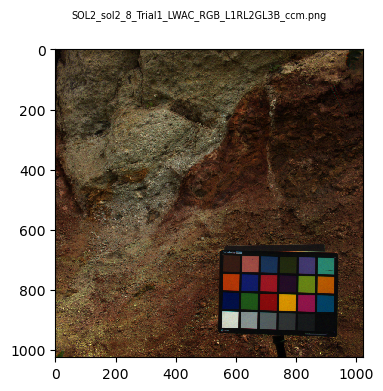

In [18]:
lwac_rgb_msc.false_rgb.export_image('ccm', show=True)
lwac_rgb_msc.export_2_envi()

### LWAC Geology Filter Processing

Load and prepare the narrowband LWAC scene.

In [19]:
lwac_msc_loader = aupy.AupeIO('LWAC', 'MSC', sol, scene, trial=trial)
lwac_msc = lwac_msc_loader.load_frame()
lwac_msc.exposure_correct()
lwac_msc.set_false_color({'R':'G06', 'G':'G03', 'B':'G01'})

Calibrate the scene reflectance to the calibration target.

Target Width: 372 Height: 243, Samples: 900
[437 501 533 568 608 665]
Target Width: 372 Height: 243, Samples: 900


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


G01 437 nm: coeff=3.88e-051/DN/s, offset=0.0542
G02 501 nm: coeff=2.05e-051/DN/s, offset=0.0269
G03 533 nm: coeff=7.9e-051/DN/s, offset=0.013
G04 568 nm: coeff=7.74e-051/DN/s, offset=0.00857
G05 608 nm: coeff=8.82e-051/DN/s, offset=0.00764
G06 665 nm: coeff=0.0001151/DN/s, offset=-0.00178


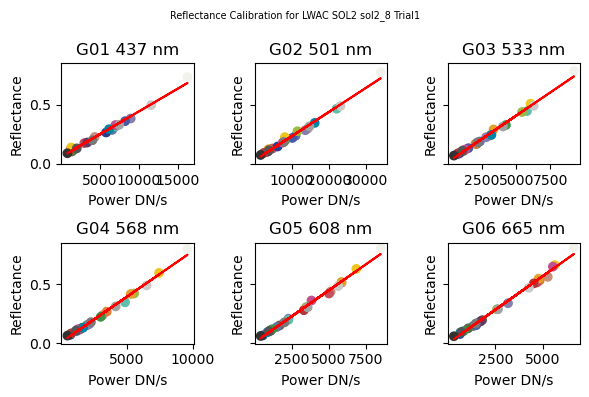

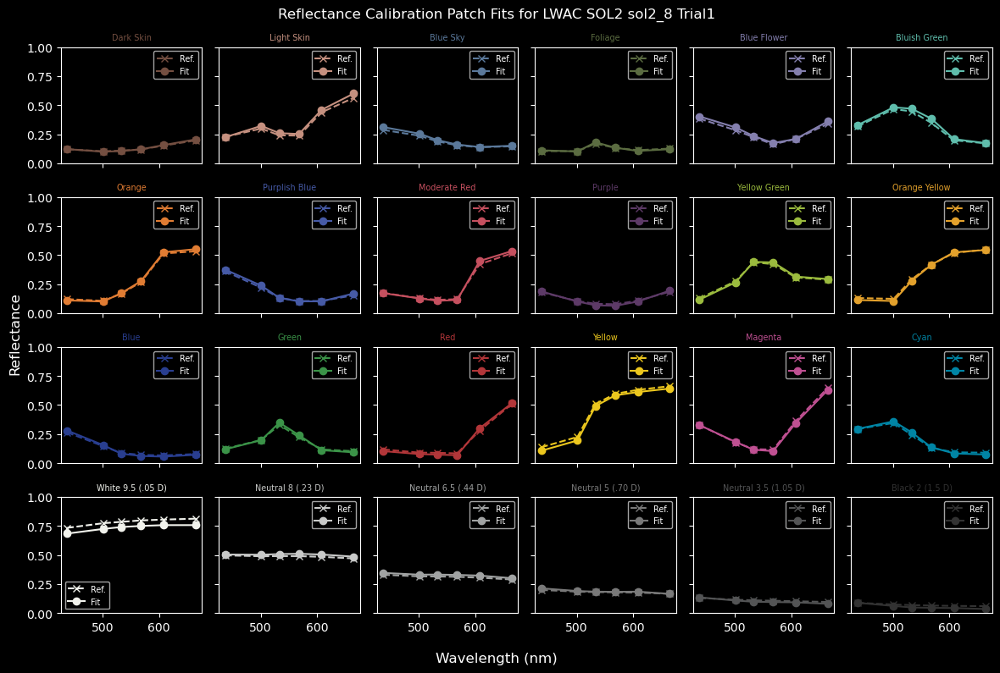

In [20]:
lwac_cal_targ.get_bad_patches(lwac_msc)
print(lwac_msc.cwls)
lwac_cal_targ.calibrate_reflectance(lwac_msc, show=True)


Export the LWAC reflectance cube to ENVI and GIF.

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced
Reflectance coefficients saved to ../data/../processed/SOL2/sol2_8/Trial1/LWAC/MSC/SOL2_sol2_8_Trial1_LWAC_G01G02G03G04G05G06_refl_coeffs.csv
Exporting image G01 
Stretching image using raw image no stretch
Applying stretch factor of 4.333725490196078e-05
Exporting image G02 
Stretching image using raw image no stretch
Applying stretch factor of 2.1294117647058822e-05
Exporting image G03 
Stretching image using raw image no stretch
Applying stretch factor of 7.50392156862745e-05
Exporting image G04 
Stretching image using raw image no stretch
Applying stretch factor of 6.554509803921569e-05
Exporting image G05 
Stretching image using raw image no stretch
Applying stretch factor of 6.747450980392157e-05
Exporting image G06 
Stretching image using raw image no stretch
Applying stretch factor of 8.193333333333332e-05


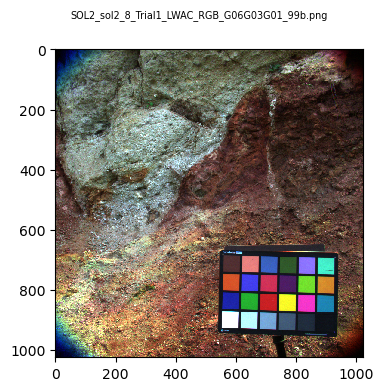

In [21]:
lwac_msc.false_rgb.export_image('99b', show=True)
lwac_msc.export_2_envi()
lwac_msc.export_2_gif()

## RWAC Processing

### RWAC RGB Processing

Load the RWAC RGB Scene.

In [22]:
rwac_rgb_msc_loader = aupy.AupeIO('RWAC', 'MSC', sol, scene, trial=trial, filter_ids=['R1R', 'R2G', 'R3B'])
rwac_rgb_msc = rwac_rgb_msc_loader.load_frame()
rwac_rgb_msc.exposure_correct()
rwac_rgb_msc.set_false_color({'R':'R1R', 'G':'R2G', 'B':'R3B'})

Export the approximate colour of the RWAC RGB scene.

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced


PosixPath('../data/../processed/SOL2/sol2_8/Trial1/RWAC/MSC/RGB/SOL2_sol2_8_Trial1_RWAC_RGB_R1RR2GR3B_99b.png')

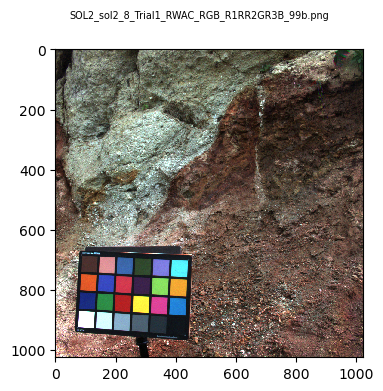

In [23]:
rwac_rgb_msc.false_rgb.export_image('99b', show=True)

Draw the calibration target in the scene.

Stretching image using 99th percentile balanced
Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


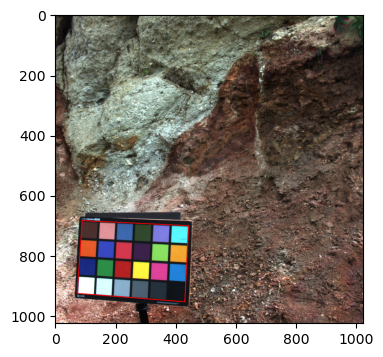

True

In [24]:
rwac_cal_targ = aupy.CalibrationTarget()
rwac_cal_targ.draw_target_outline(rwac_rgb_msc.false_rgb.get_image('99b'), show=True)

Calibrate the reflectance of the colour RWAC image.

Target Width: 354 Height: 241, Samples: 841
Target Width: 354 Height: 241, Samples: 841
R1R 641 nm: coeff=9.65e-061/DN/s, offset=0.0037
R2G 540 nm: coeff=8.71e-061/DN/s, offset=0.0118
R3B 464 nm: coeff=8.39e-061/DN/s, offset=0.0412


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


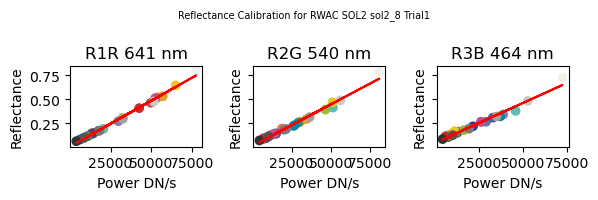

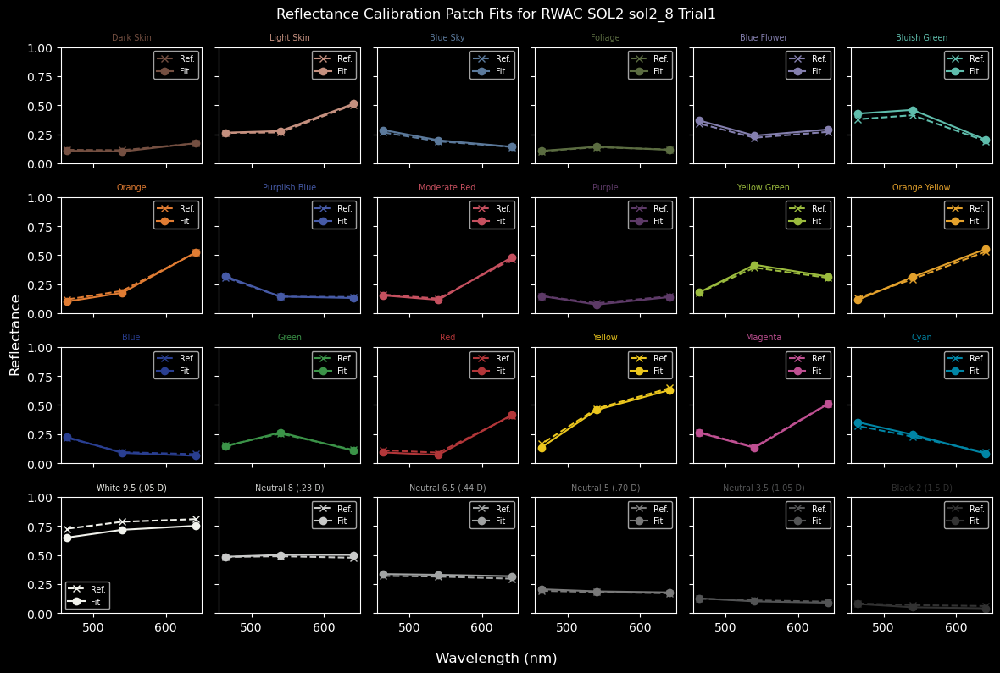

In [26]:
rwac_cal_targ.get_bad_patches(rwac_rgb_msc)
rwac_cal_targ.calibrate_reflectance(rwac_rgb_msc,show=True)

Calibrate the colour of the reflectance RWAC RGB image.

Target Width: 354 Height: 241, Samples: 841
Stretching image using brightest pixel unbalanced
Target Width: 354 Height: 241, Samples: 841


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


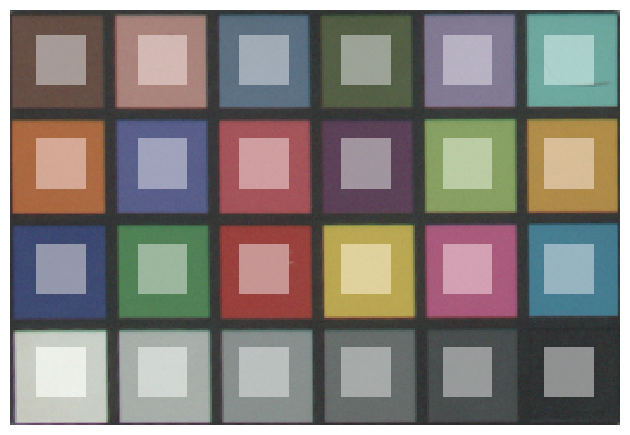

/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:68: RuntimeWarning: invalid value encountered in power
  return (x ** gamma)
/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:911: OptimizeWarning: Covariance of the parameters could not be estimated
  fit, covar = curve_fit(gamma_curve,


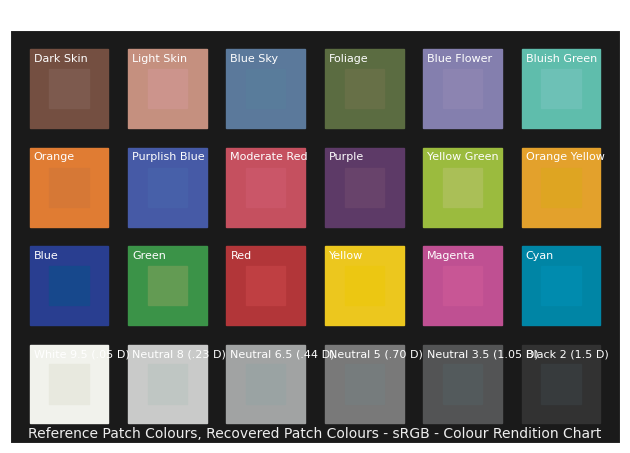

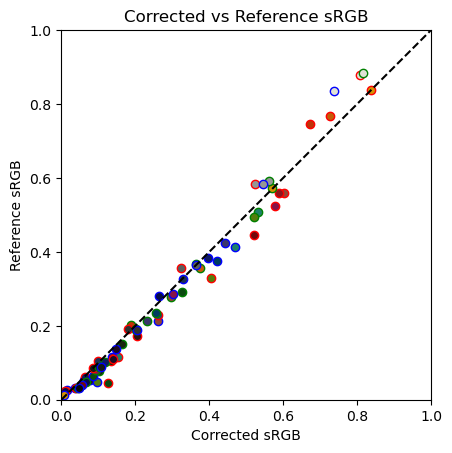

In [27]:
rwac_cal_targ.get_bad_patches(rwac_rgb_msc.false_rgb)
rwac_cal_targ.calibrate_colour(rwac_rgb_msc.false_rgb, show=True)

Export the calibrated colour image and refletance image to ENVI.

Exporting image using colour correction matrix
Stretching image using brightest pixel unbalanced
CCM saved to ../data/../processed/SOL2/sol2_8/Trial1/RWAC/MSC/RGB/SOL2_sol2_8_Trial1_RWAC_ccm.csv
Reflectance coefficients saved to ../data/../processed/SOL2/sol2_8/Trial1/RWAC/MSC/SOL2_sol2_8_Trial1_RWAC_R1RR2GR3B_refl_coeffs.csv


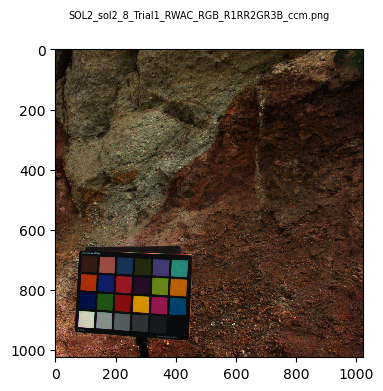

In [28]:
rwac_rgb_msc.false_rgb.export_image('ccm', show=True)
rwac_rgb_msc.export_2_envi()

### RWAC Geology Filter Processing

Load and prepare the narrowband geology filter RWAC multispectral cube.

In [29]:
# Narrowband Reflectance Calibration
rwac_msc_loader = aupy.AupeIO('RWAC', 'MSC', sol, scene, trial=trial)
rwac_msc = rwac_msc_loader.load_frame()
rwac_msc.exposure_correct()
rwac_msc.set_false_color({'R':'G11', 'G':'G09', 'B':'G07'})

Calibrate the reflectance of the RWAC geology filters image.

Target Width: 354 Height: 241, Samples: 841
Target Width: 354 Height: 241, Samples: 841
G07 741 nm: coeff=5.73e-051/DN/s, offset=-0.00464
G08 769 nm: coeff=5.46e-051/DN/s, offset=-0.00931
G09 830 nm: coeff=9.34e-051/DN/s, offset=-0.0208
G10 897 nm: coeff=0.0001911/DN/s, offset=-0.0136
G11 941 nm: coeff=0.0003551/DN/s, offset=-0.00447
G12 976 nm: coeff=0.0003881/DN/s, offset=-0.012


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


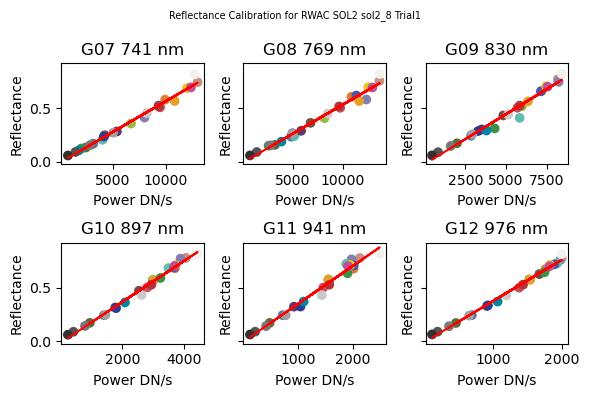

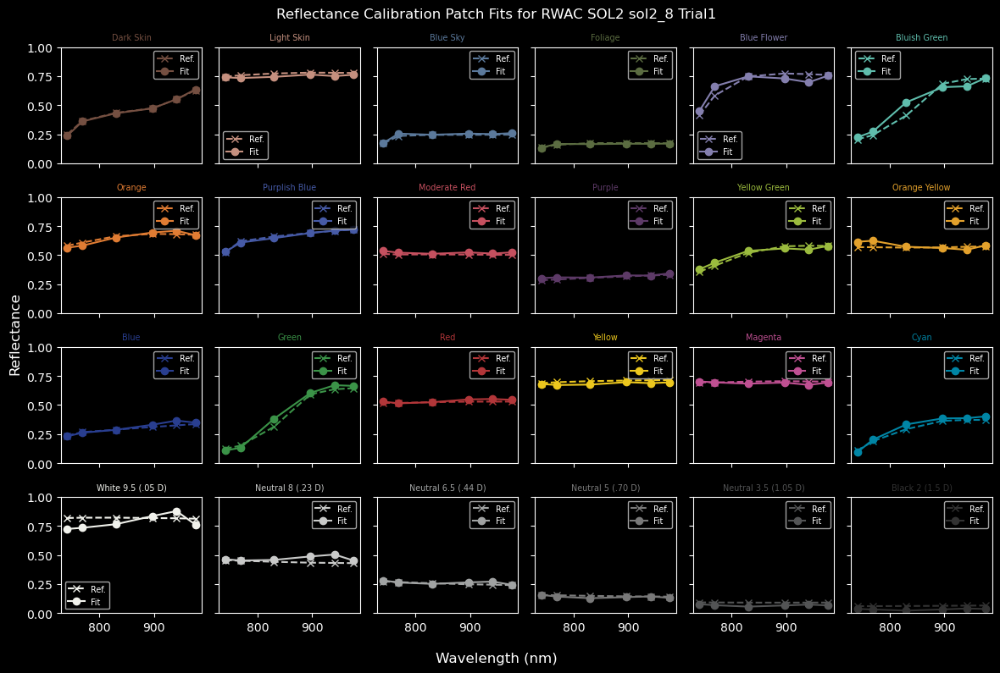

In [30]:
rwac_cal_targ.get_bad_patches(rwac_msc)
rwac_cal_targ.calibrate_reflectance(rwac_msc,show=True)

Export a simple browse product of the RWAC geology filters, and an ENVI cube of the scene, and a gif.

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced
Reflectance coefficients saved to ../data/../processed/SOL2/sol2_8/Trial1/RWAC/MSC/SOL2_sol2_8_Trial1_RWAC_G07G08G09G10G11G12_refl_coeffs.csv
Exporting image G07 
Stretching image using raw image no stretch
Applying stretch factor of 4.1094117647058826e-05
Exporting image G08 
Stretching image using raw image no stretch
Applying stretch factor of 3.912549019607843e-05
Exporting image G09 
Stretching image using raw image no stretch
Applying stretch factor of 6.367843137254902e-05
Exporting image G10 
Stretching image using raw image no stretch
Applying stretch factor of 0.0001312470588235294
Exporting image G11 
Stretching image using raw image no stretch
Applying stretch factor of 0.0002500745098039216
Exporting image G12 
Stretching image using raw image no stretch
Applying stretch factor of 0.000261443137254902


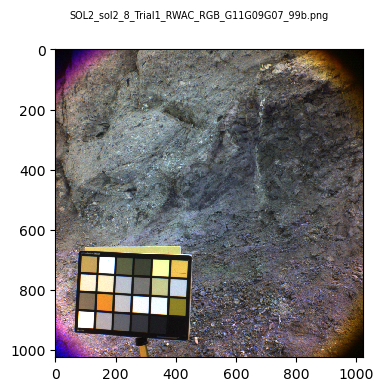

In [31]:
rwac_msc.false_rgb.export_image('99b', show=True)
rwac_msc.export_2_envi()
rwac_msc.export_2_gif()

## LWAC->RWAC Rectification

Here we find the homography matrix that warps the LWAC image to the RWAC view.

This allows us to warp the LWAC geology filters to align with the RWAC filters, allowing us to construct a complete 12-band geology cube.

This is a very simple stereo process, that relies on the assumption that all points that are warped lie on a flat plane. This is rarely fulfilled for all points in the image, particularly for natural geologic scenes.

So we make an approximation by selecting a region in each image that we will search for match points within. The idea is to select a region that we are interested in, and that could be approximated as a plane.

### Select regions and find Warp

Note that we just have to use LWAC and RWAC views to perform the image matching. We don't have to pass this function the full 6-band LWAC and RWAC cubes - rather, we pass the RGB images, that have been reflectance calibrated, such that we expect pixel values of the same feature in each scene to be approximately equal.

Stretching image using 99th percentile balanced
Stretching image using 99th percentile balanced


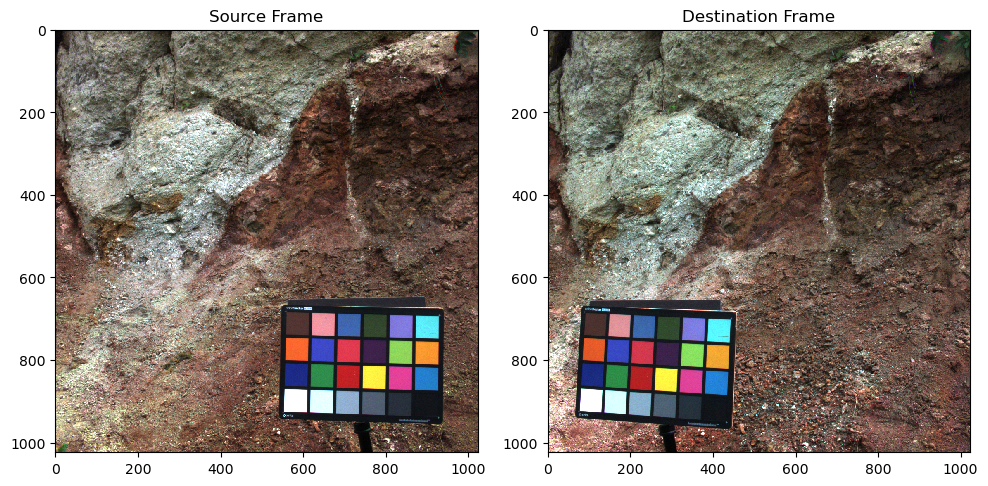

In [32]:
st_lrwac = aupy.StereoTools(lwac_rgb_msc.false_rgb.get_image('99b'), rwac_rgb_msc.false_rgb.get_image('99b'))

In [33]:
st_lrwac.select_match_regions()
tag = input('Enter tag for LWAC to RWAC warp: ') # prompt user for tag

Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!
Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


We finish the process by adding a simple one word description of the feature we have chosen in each view to optimise the warp for. E.g. 'caltarg' or 'cliffface'.

Now we find solve for the homography matrix that performs the transform on the LWAC to give the RWAC view.

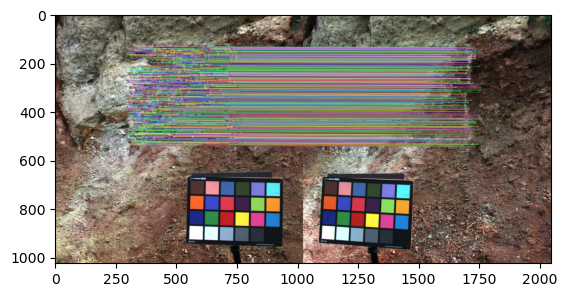

Found 1651 good matches between source and destination regions.


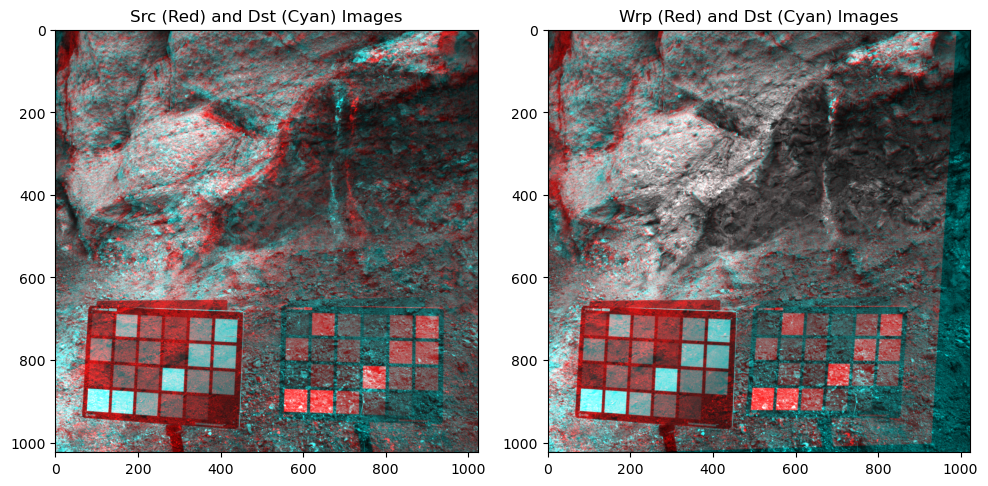

In [34]:
st_lrwac.findWarp(show=True)

### Apply the Warp

We make a new destination MSC object that will host the full 12-band cube, and we pass the LWAC and RWAC MSC's to the applywarp function.

In [35]:
lrwac_msc_loader = aupy.AupeIO('LRWAC', 'MSC', sol, scene, trial=trial)
lrwac_msc = lrwac_msc_loader.load_frame()
st_lrwac.applyWarp(lwac_msc, rwac_msc, lrwac_msc, tag)

We export a browse product that uses both the LWAC and RWAC filters, and export this along with the ENVI cube and 12-band gif.

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced
Reflectance coefficients saved to ../data/../processed/SOL2/sol2_8/Trial1/LRWAC/MSC/contact/SOL2_sol2_8_Trial1_LRWAC_G01G02G03G04G05G06G07G08G09G10G11G12_refl_coeffs.csv
Exporting image G01 
Stretching image using raw image no stretch
Applying stretch factor of 4.333725490196078e-05
Exporting image G02 
Stretching image using raw image no stretch
Applying stretch factor of 2.1294117647058822e-05
Exporting image G03 
Stretching image using raw image no stretch
Applying stretch factor of 7.50392156862745e-05
Exporting image G04 
Stretching image using raw image no stretch
Applying stretch factor of 6.554509803921569e-05
Exporting image G05 
Stretching image using raw image no stretch
Applying stretch factor of 6.747450980392157e-05
Exporting image G06 
Stretching image using raw image no stretch
Applying stretch factor of 8.193333333333332e-05
Exporting image G07 
Stretching image using raw ima

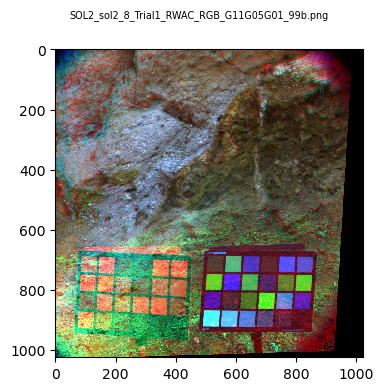

In [36]:
lrwac_msc.set_false_color({'R': 'G11', 'G': 'G05', 'B': 'G01'})
lrwac_msc.false_rgb.export_image('99b', show=True)
lrwac_msc.export_2_envi()
lrwac_msc.export_2_gif()

## HRC Processing

### HRC RGB Colour and Reflectance Processing

First we load HRC as an RGB object, and get an approximate colour balance (after debayering).

Filter response file data/response_files/HRC/HR0.csv does not exist
Filter response file data/response_files/HRC/HR0.csv does not exist
Filter response file data/response_files/HRC/HR0.csv does not exist
Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced


PosixPath('../data/../processed/SOL2/sol2_8/Trial1/HRC/RGB/SOL2_sol2_8_Trial1_HRC_RGB_H1RH2GH3B_99b.png')

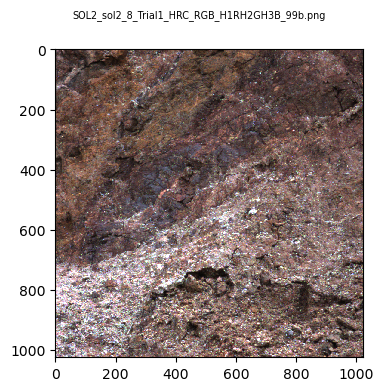

In [37]:
hrc_rgb_loader = aupy.AupeIO('HRC', 'RGB', sol, scene, trial=trial)
hrc_rgb = hrc_rgb_loader.load_frame()
hrc_rgb.export_image('99b', show=True)       

Now we reload the image and treat it as a 3-band multispectral cube.

HRC often does not include a calibration target image in the scene, but we approximate reflectance by transferring the RWAC reflectance coefficients to HRC. In principal, there is a device-dependent (i.e. scene independent) transform, under the assumption that the RGB transmission profiles between the devices is similar.

So we import a matrix transform that we found from an HRC scene that *did* have a calibration target, that we calibrated to reflectance. We found the matrix transform that mapped the RWAC reflectance coefficients to the HRC reflectance coefficients, and then stashed this matrix in the aupy/data directory.

In [38]:
hrc_loader = aupy.AupeIO('HRC', 'MSC', sol, scene, trial=trial)
hrc_msc = hrc_loader.load_frame()                
hrc_msc.exposure_correct()
hrc_msc.load_reflectance_coefficients_from_transfer(rwac_rgb_msc)

Filter response file data/response_files/HRC/HR0.csv does not exist
Filter response file data/response_files/HRC/HR0.csv does not exist
Filter response file data/response_files/HRC/HR0.csv does not exist
HRC frame debayered and converted to MSC
CCM loaded from data/HRC_reflectance2srgb_ccm.csv


In [39]:
hrc_msc.apply_reflectance_calibration()

We also transfer the reflectance->sRGB colour correction matrix from the RWAC... shouldn't this actually have been learned from HRC? Yes we should actually also have saved an HRC reflectance->sRGB matrix, as this also should be scene independent, as the image is reflectance units.

Exporting image using colour correction matrix
CCM saved to ../data/../processed/SOL2/sol2_8/Trial1/HRC/MSC/SOL2_sol2_8_Trial1_HRC_ccm.csv
Reflectance coefficients saved to ../data/../processed/SOL2/sol2_8/Trial1/HRC/MSC/SOL2_sol2_8_Trial1_HRC_H1RH2GH3B_refl_coeffs.csv


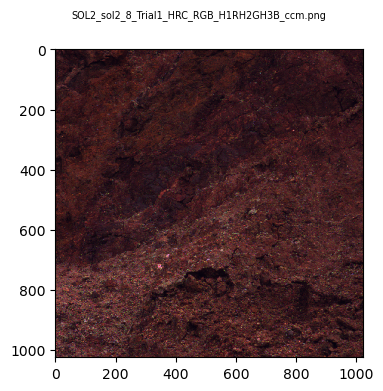

In [40]:
hrc_msc.false_rgb.export_image('ccm', show=True)
hrc_msc.export_2_envi()

### Warping the LRWAC 12-band cube to the HRC View

Finally, we look for a warp that can map the 12-band LRWAC multispectral cube to the view of HRC, such that we can lookup the spectra of pixels in HRC scenes.

Stretching image using brightest pixel unbalanced


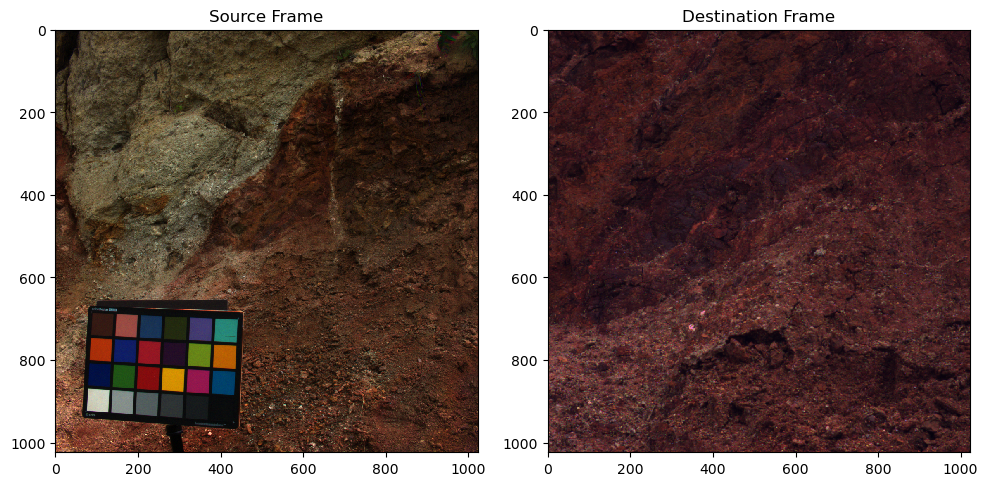

In [41]:
st_hrc = aupy.StereoTools(rwac_rgb_msc.false_rgb.get_image('ccm'), hrc_msc.false_rgb.get_image('ccm'))

In [42]:
st_hrc.select_match_regions()
# prompt user for tag
tag = input('Enter tag for LRWAC to HRC warp: ')

Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!
Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


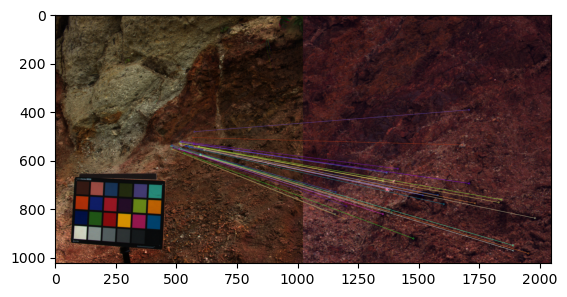

Found 29 good matches between source and destination regions.


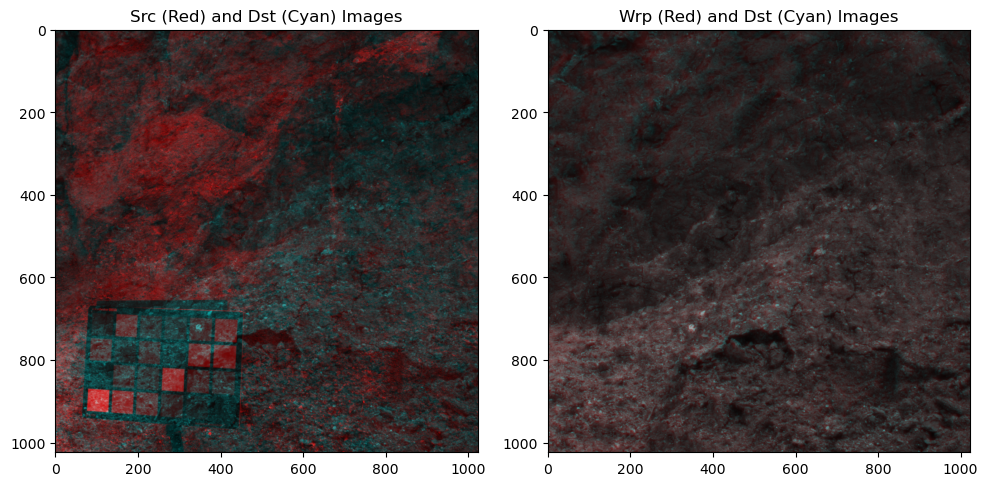

In [43]:
st_hrc.findWarp(show=True)

We prepare a new 12-band multispectral cube that we will warp the LRWAC cube into.

In [44]:
lrwhrc_msc_loader = aupy.AupeIO('LRWHRC', 'MSC', sol, scene, trial=trial)
lrwhrc_msc = lrwhrc_msc_loader.load_frame()
st_hrc.applyWarp(lrwac_msc, hrc_msc, lrwhrc_msc, tag)
lrwhrc_msc.set_false_color({'R': 'G11', 'G': 'G05', 'B': 'G01'})

We export the browse product, and the 21 band cube to ENVI, and a GIF.

In [45]:
lrwhrc_msc.false_rgb.export_image('99b')
lrwhrc_msc.export_2_envi()
lrwhrc_msc.export_2_gif()

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced
Reflectance coefficients saved to ../data/../processed/SOL2/sol2_8/Trial1/LRWHRC/MSC/contact/SOL2_sol2_8_Trial1_LRWHRC_G01G02G03G04G05G06G07G08G09G10G11G12_refl_coeffs.csv
Exporting image G01 
Stretching image using raw image no stretch
Applying stretch factor of 4.333725490196078e-05
Exporting image G02 
Stretching image using raw image no stretch
Applying stretch factor of 2.1294117647058822e-05
Exporting image G03 
Stretching image using raw image no stretch
Applying stretch factor of 7.50392156862745e-05
Exporting image G04 
Stretching image using raw image no stretch
Applying stretch factor of 6.554509803921569e-05
Exporting image G05 
Stretching image using raw image no stretch
Applying stretch factor of 6.747450980392157e-05
Exporting image G06 
Stretching image using raw image no stretch
Applying stretch factor of 8.193333333333332e-05
Exporting image G07 
Stretching image using raw i